In [1]:
pip install deap

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.4/135.4 kB 4.4 MB/s eta 0:00:00


In [2]:
pip install pyswarm

  Preparing metadata (setup.py) ... done
  Created wheel for pyswarm: filename=pyswarm-0.6-py3-none-any.whl size=4464 sha256=9d2b1e756be94e72ad2ebc05729783e78775ca89fbcb2085856e4c852d600aa5
  Stored in directory: /root/.cache/pip/wheels/71/67/40/62fa158f497f942277cbab8199b05cb61c571ab324e67ad0d6
Successfully built pyswarm


In [3]:
#Primero importamos algunas librerias
import random
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from matplotlib.colors import LogNorm
import matplotlib.animation as animation
from IPython.display import HTML
from deap import algorithms, base, creator, tools
from pyswarm import pso
from scipy.optimize import minimize

## Función de Rastrigin

Función de Rastrigin en 2D: $$
f(x_1, x_2) = 20 + \sum_{i=1}^{2} x_i^2 - 10cos\left( 2\pi{x_i} \right), \quad x_i \in [-5.12, 5.12], \quad i = 1, 2
$$
Función de Rastrigin en 3D
$$f(x_1, x_2,x_3) = 30 + \sum_{i=1}^{2} x_i^2 - 10cos\left( 2\pi{x_i} \right), \quad x_i \in [-5.12, 5.12], \quad i = 1, 2,3
$$





In [4]:
def f_rastrigin2d(x1, x2):
  y = 20 + x1 ** 2 - 10 * np.cos(2 * np.pi * x1) + x2 ** 2 - 10 * np.cos(2 * np.pi * x2)
  return y

def f_rastrigin3d(x1,x2,x3):
  y = 30 + x1 ** 2 - 10 * np.cos(2 * np.pi * x1) + x2 ** 2 - 10 * np.cos(2 * np.pi * x2) + x3 ** 2 - 10 * np.cos(2 * np.pi * x3)
  return y

n = 50
x1 = np.linspace(-5.12, 5.12, n)
x2 = np.linspace(-5.12, 5.12, n)

X1, X2 = np.meshgrid(x1, x2)
X = np.vstack((X1.flatten(), X2.flatten())).T
z = f_rastrigin2d(X[:, 0], X[:, 1])
Z = z.reshape(n, n)

### Función de Rastrigin en 2D

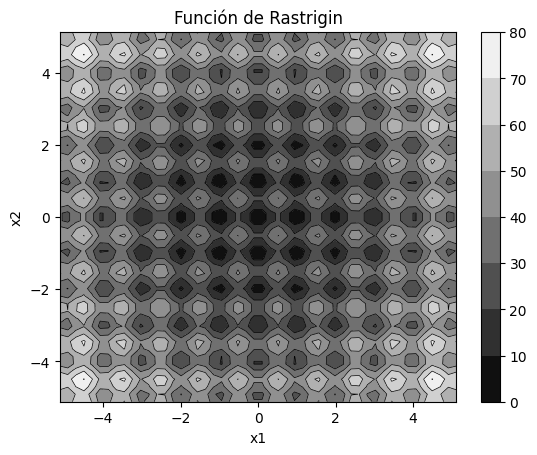

In [5]:
# Crear un gráfico de contorno con valores numéricos
levels = np.arange(0, 90, 10)
cp = plt.contourf(x1, x2, Z, levels=levels, cmap='gray')
plt.colorbar(cp)

# Agregar líneas de contorno
plt.contour(x1, x2, Z, levels=levels, colors='k', linewidths=0.5)

# Título y etiquetas de los ejes
plt.title("Función de Rastrigin")
plt.xlabel("x1")
plt.ylabel("x2")

# Mostrar el gráfico
plt.show()


In [6]:
# Cálculo de la función
z = f_rastrigin2d(X1, X2)

# Creación de la figura
fig = go.Figure(data=[go.Surface(x=X1, y=X2, z=z)])

# Personalización de la figura
fig.update_layout(
    title='Función de Rastrigin 2D',
    scene = dict(
        xaxis_title='X1',
        yaxis_title='X2',
        zaxis_title='Y',
        aspectmode='cube',
        camera=dict(
            eye=dict(x=1.75, y=-1.75, z=1.25)
        )
    )
)

# Mostrar la figura
fig.show()

##Descenso por gradiente

### En 2 dimensiónes

In [7]:
def rastrigin(x):
    n = len(x)
    return 10*n + np.sum(x**2 - 10*np.cos(2*np.pi*x))

def gradient(x):
    n = len(x)
    grad = np.zeros(n)
    for i in range(n):
        grad[i] = 2*x[i] + 20*np.pi*np.sin(2*np.pi*x[i])
    return grad

def hessian(x):
    n = len(x)
    hess = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            if i == j:
                hess[i][i] = 2 + 40*np.pi**2*np.cos(2*np.pi*x[i])
            else:
                hess[i][j] = 0
    return hess

def optimize_rastrigin(initial_guess, max_iterations, tolerance=1e-6):
    x = initial_guess
    path = [x]
    for i in range(max_iterations):
        grad = gradient(x)
        hess = hessian(x)
        step = np.linalg.solve(hess, -grad)
        x_new = x + step
        if np.linalg.norm(x_new - x) < tolerance:
            break
        x = x_new
        path.append(x)
    return x, path

Init value: [ 1.95082842 -0.86915639]
Minimum: [ 1.98991223 -0.99495867]
Function value at minimum: 4.974790247647627
Optimization path: 
Punto evaluado:[ 1.95082842 -0.86915639]-- Valor de la función en el punto: 8.227907648680018
Punto evaluado:[ 1.99103861 -1.03276312]-- Valor de la función en el punto: 5.257819957020914
Punto evaluado:[ 1.98991247 -0.99438296]-- Valor de la función en el punto: 4.974855960990709
Punto evaluado:[ 1.98991223 -0.99495867]-- Valor de la función en el punto: 4.974790247647627


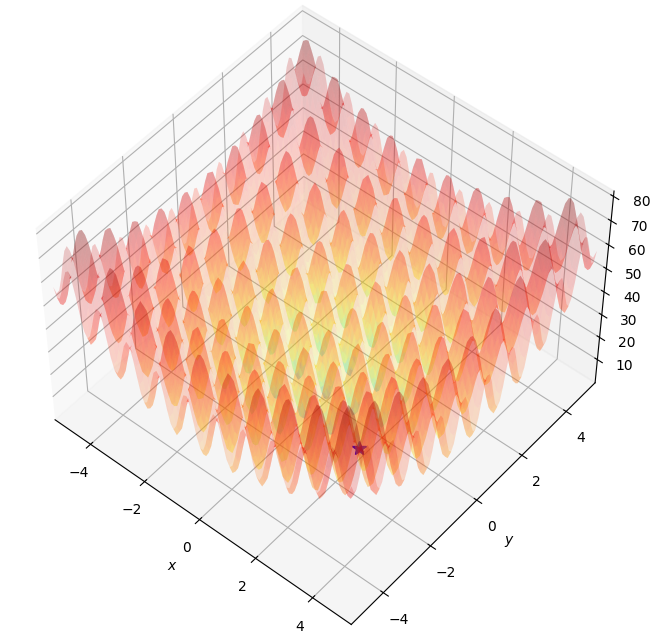

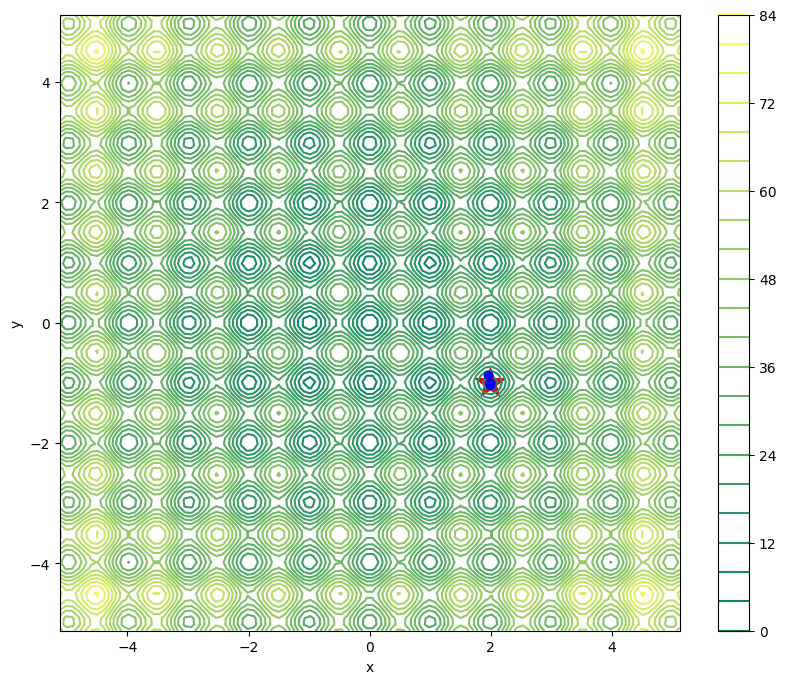

In [8]:
rastrigin_init_point_2D = np.random.uniform(-5.12, 5.12, size=2) #Se genera un número aleatorio y se acota entre el dominio de la función
max_iterations = 1000
rastrigin_min_2D,rastrigin_path_2D = optimize_rastrigin(rastrigin_init_point_2D, 1000)

#Impresión de resultados
print(f"Init value: {rastrigin_init_point_2D}")
print(f"Minimum: {rastrigin_min_2D}")
print(f"Function value at minimum: {rastrigin(rastrigin_min_2D)}")
print("Optimization path: ")
for point in rastrigin_path_2D:
    print(f"Punto evaluado:{point}--", f"Valor de la función en el punto: {rastrigin(point)}")

    # Generate a grid of x, y values
rtg_x_min, rtg_x_max, rtg_x_maxvalues = -5.12, 5.12, 100
rtg_y_min, rtg_y_max, rtg_y_maxvalues = -5.12, 5.12, 100

x_rastrigin = np.linspace(rtg_x_min, rtg_x_max, rtg_x_maxvalues)
y_rastrigin = np.linspace(rtg_y_min, rtg_y_max, rtg_y_maxvalues)
X_rastrigin, Y_rastrigin = np.meshgrid(x_rastrigin, y_rastrigin)
# Compute the Rastrigin function for each (x, y) pair
Z_rastrigin = np.zeros_like(X_rastrigin)
for i in range(X_rastrigin.shape[0]):
    for j in range(X_rastrigin.shape[1]):
        Z_rastrigin[i, j] = rastrigin(np.array([X_rastrigin[i, j], Y_rastrigin[i, j]]))

rastrigin_minimum= rastrigin_min_2D.reshape(-1, 1)

#Test plot

rastrigin_surface_fig = plt.figure(figsize=(10,8))
rastrigin_surface_axes = plt.axes(projection='3d', elev=50, azim=-50)

rastrigin_surface_axes.plot_surface(X_rastrigin, Y_rastrigin, Z_rastrigin, norm=LogNorm(), rstride=1, cstride=1,
                edgecolor='none', alpha=.2, cmap=plt.cm.jet)
rastrigin_surface_axes.plot(*rastrigin_minimum, rastrigin(rastrigin_minimum), 'b*', markersize=10)

rastrigin_surface_axes.set_xlabel('$x$')
rastrigin_surface_axes.set_ylabel('$y$')
rastrigin_surface_axes.set_zlabel('$z$')

rastrigin_surface_axes.set_xlim((rtg_x_min, rtg_x_max))
rastrigin_surface_axes.set_ylim((rtg_y_min, rtg_y_max))

plt.show()

# Create a 2D contour plot of the Rastrigin function and plot the ptimization path
rastrigin_contour_fig, rastrigin_contour_axes = plt.subplots(figsize=(10,8))
contour = rastrigin_contour_axes.contour(X_rastrigin, Y_rastrigin, Z_rastrigin, levels=20, cmap='summer')
rastrigin_contour_axes.set_xlabel('x')
rastrigin_contour_axes.set_ylabel('y')

for point in rastrigin_path_2D:
  rastrigin_contour_axes.plot(*point, 'o-',color='blue',alpha=1)

# Add a marker for the global minimum at (0, 0)
rastrigin_contour_axes.scatter(*rastrigin_minimum, marker='*', s=500, color='red')
plt.colorbar(contour)
plt.show()

### Animación

<ipython-input-9-b8b00c132dcf>:4: MatplotlibDeprecationWarning:

Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later

<ipython-input-9-b8b00c132dcf>:4: MatplotlibDeprecationWarning:

Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later



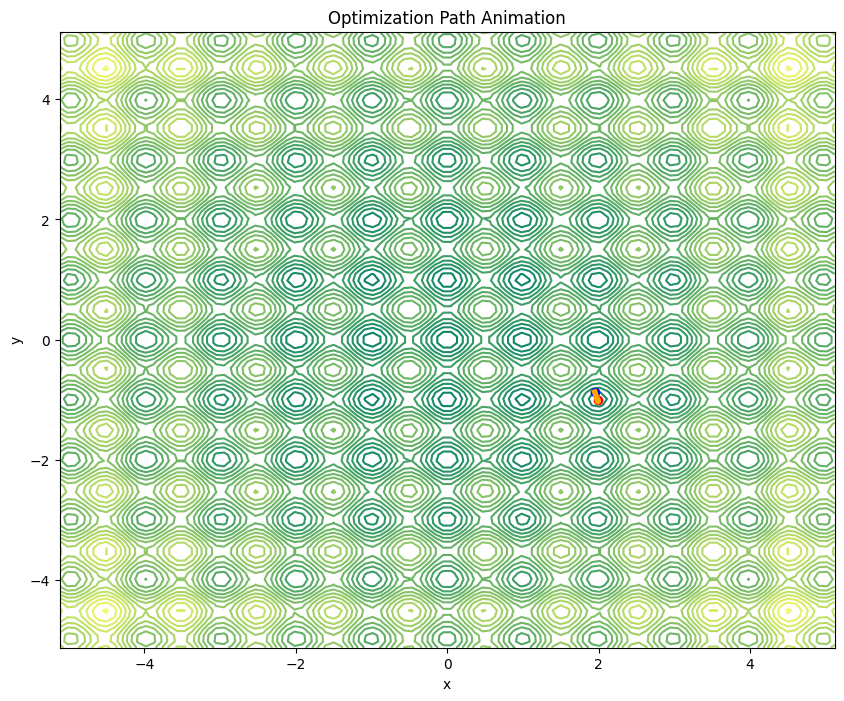

In [9]:
# Define the function to update the animation
def update(frame):
    x = rastrigin_path_2D[frame]
    line.set_data(x[0], x[1])
    if frame > 0:
        line_trace.set_data([rastrigin_path_2D[i][0] for i in range(frame+1)], [rastrigin_path_2D[i][1] for i in range(frame+1)])
    return line, line_trace
# Set the starting point for the optimization
# x_start = np.array([-4, 4])

# Run the optimization
# x_opt, path = newton_raphson_optimization(x_start)

# Plot the contour and the starting point
rastrigin_contour_fig, rastrigin_contour_axes = plt.subplots(figsize=(10,8))
rastrigin_contour_axes.set_title('Optimization Path Animation')
rastrigin_contour_axes.set_xlabel('x')
rastrigin_contour_axes.set_ylabel('y')
rastrigin_contour = rastrigin_contour_axes.contour(X_rastrigin, Y_rastrigin, Z_rastrigin, levels=20, cmap='summer')
rastrigin_contour_axes.plot(rastrigin_init_point_2D[0], rastrigin_init_point_2D[1], 'o', color='blue')

# Set up the animation

line, = rastrigin_contour_axes.plot([], [], 'o-', color='red', lw=10)
line_trace, = rastrigin_contour_axes.plot([], [], '-', color='orange', lw=4)
ani = animation.FuncAnimation(rastrigin_contour_fig, update, frames=len(rastrigin_path_2D), interval=500, blit=True)

HTML(ani.to_jshtml())

### En 3 dimensiónes

In [10]:
rastrigin_init_point_3D = np.random.uniform(-5.12, 5.12, size=3) #Se genera un número aleatorio y se acota entre el dominio de la función
rastrigin_min_3D,rastrigin_path_3D = optimize_rastrigin(rastrigin_init_point_3D, 1000)

#Impresión de resultados
print("Init value", rastrigin_init_point_3D)
print("Minimum:", rastrigin_min_3D)
print("Function value at minimum:", rastrigin(rastrigin_min_3D))
print("Optimization path: ")
for point in rastrigin_path_3D:
    print(f"Punto evaluado:{point}--", f"Valor de la función en el punto: {rastrigin(point)}")

Init value [-3.03052806 -1.60746553 -4.05084069]
Minimum: [-2.9848557  -1.50764073 -3.97978386]
Function value at minimum: 47.13530391875446
Optimization path: 
Punto evaluado:[-3.03052806 -1.60746553 -4.05084069]-- Valor de la función en el punto: 46.67230310893897
Punto evaluado:[-2.98421933 -1.48968336 -3.97697591]-- Valor de la función en el punto: 47.07363034190647
Punto evaluado:[-2.98485583 -1.50766849 -3.97978731]-- Valor de la función en el punto: 47.13530376998624
Punto evaluado:[-2.9848557  -1.50764073 -3.97978386]-- Valor de la función en el punto: 47.13530391875446


## Algoritmos evolutivos

### En 2 dimensiónes

In [11]:
# Definir los límites de los parámetros
limite_inferior = -5.0
limite_superior = 5.0

# Definir los parámetros del algoritmo genético
num_generaciones = 50
tamano_poblacion = 100
probabilidad_mutacion = 0.2
probabilidad_cruce = 0.5

# Crear los tipos de objeto para el problema
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individuo", list, fitness=creator.FitnessMin)

# Crear la caja de herramientas del algoritmo genético
toolbox = base.Toolbox()
toolbox.register("attr_float", random.uniform, limite_inferior, limite_superior)
toolbox.register("individuo", tools.initCycle, creator.Individuo,
                 (toolbox.attr_float, toolbox.attr_float), n=1)
toolbox.register("poblacion", tools.initRepeat, list, toolbox.individuo)

# Definir la función de evaluación
def evaluar(individuo):
    return f_rastrigin2d(individuo[0], individuo[1]),

# Definir los operadores genéticos
toolbox.register("evaluate", evaluar)
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=1, indpb=0.1)
toolbox.register("select", tools.selTournament, tournsize=3)

# Crear la población inicial
poblacion = toolbox.poblacion(n=tamano_poblacion)

# Ejecutar el algoritmo genético
for generacion in range(num_generaciones):
    # Seleccionar a los padres
    padres = toolbox.select(poblacion, len(poblacion))
    # Clonar los padres para aplicar operadores genéticos
    hijos = list(map(toolbox.clone, padres))

    # Aplicar cruce y mutación a los hijos
    for hijo in hijos:
        if random.random() < probabilidad_cruce:
            toolbox.mate(hijo, random.choice(hijos))
            del hijo.fitness.values

        if random.random() < probabilidad_mutacion:
            toolbox.mutate(hijo)
            del hijo.fitness.values

    # Evaluar la aptitud de los nuevos individuos
    individuos_nuevos = [individuo for individuo in hijos if not individuo.fitness.valid]
    aptitudes_nuevas = toolbox.map(toolbox.evaluate, individuos_nuevos)
    for individuo, aptitud in zip(individuos_nuevos, aptitudes_nuevas):
        individuo.fitness.values = aptitud

    # Reemplazar la población anterior por la nueva generación
    poblacion = hijos

# Seleccionar al mejor individuo
mejor_individuo = tools.selBest(poblacion, 1)[0]
print("Mejor solución encontrada:", mejor_individuo)
print("Valor de la función objetivo:", mejor_individuo.fitness.values[0])

Mejor solución encontrada: [2.0741905701570613, 1.0935769977452952]
Valor de la función objetivo: 1.3290302352496486


### En 3 dimensiónes

In [12]:
# Definir los límites de los parámetros
limite_inferior = -5.0
limite_superior = 5.0

# Definir los parámetros del algoritmo genético
num_generaciones = 50
tamano_poblacion = 100
probabilidad_mutacion = 0.2
probabilidad_cruce = 0.5

# Crear los tipos de objeto para el problema
creator.create("FitnessMin", base.Fitness, weights=(-1.0,))
creator.create("Individuo", list, fitness=creator.FitnessMin)

# Crear la caja de herramientas del algoritmo genético
toolbox = base.Toolbox()
toolbox.register("attr_float", random.uniform, limite_inferior, limite_superior)
toolbox.register("individuo", tools.initRepeat, creator.Individuo,
                 toolbox.attr_float, n=3)
toolbox.register("poblacion", tools.initRepeat, list, toolbox.individuo)

# Definir la función de evaluación
def evaluar(individuo):
    return f_rastrigin3d(individuo[0], individuo[1], individuo[2]),

# Definir los operadores genéticos
toolbox.register("evaluate", evaluar)
toolbox.register("mate", tools.cxBlend, alpha=0.5)
toolbox.register("mutate", tools.mutGaussian, mu=0, sigma=1, indpb=0.1)
toolbox.register("select", tools.selTournament, tournsize=3)

# Crear la población inicial
poblacion = toolbox.poblacion(n=tamano_poblacion)

# Ejecutar el algoritmo genético
for generacion in range(num_generaciones):
    # Seleccionar a los padres
    padres = toolbox.select(poblacion, len(poblacion))
    # Clonar los padres para aplicar operadores genéticos
    hijos = list(map(toolbox.clone, padres))

    # Aplicar cruce y mutación a los hijos
    for hijo in hijos:
        if random.random() < probabilidad_cruce:
            toolbox.mate(hijo, random.choice(hijos))
            del hijo.fitness.values

        if random.random() < probabilidad_mutacion:
            toolbox.mutate(hijo)
            del hijo.fitness.values

    # Evaluar la aptitud de los nuevos individuos
    individuos_nuevos = [individuo for individuo in hijos if not individuo.fitness.valid]
    aptitudes_nuevas = toolbox.map(toolbox.evaluate, individuos_nuevos)
    for individuo, aptitud in zip(individuos_nuevos, aptitudes_nuevas):
        individuo.fitness.values = aptitud

    # Reemplazar la población anterior por la nueva generación
    poblacion = hijos

# Seleccionar al mejor individuo
mejor_individuo = tools.selBest(poblacion, 1)[0]
print("Mejor solución encontrada:", mejor_individuo)
print("Valor de la función objetivo:", mejor_individuo.fitness.values[0])

/usr/local/lib/python3.10/dist-packages/deap/creator.py:185: RuntimeWarning:

A class named 'FitnessMin' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.

/usr/local/lib/python3.10/dist-packages/deap/creator.py:185: RuntimeWarning:

A class named 'Individuo' has already been created and it will be overwritten. Consider deleting previous creation of that class or rename it.



Mejor solución encontrada: [0.0035505572493821575, -0.01680672623808434, 0.05353629162622728]
Valor de la función objetivo: 0.621792050910857


## Optimización de particulas

### En 2 dimensiónes

In [13]:
lb = [-5, -5]  # límite inferior de las variables
ub = [5, 5]    # límite superior de las variables

x_opt, f_opt = pso(lambda x: f_rastrigin2d(x[0], x[1]), lb, ub)

print("El punto óptimo es:", x_opt)

Stopping search: Swarm best objective change less than 1e-08
El punto óptimo es: [-3.54804955e-06 -1.39343434e-05]


### En 3 dimensiónes

In [14]:
lb = [-10, -10, -10]  # límite inferior de las variables
ub = [10, 10, 10]     # límite superior de las variables

x_opt, f_opt = pso(lambda x: f_rastrigin3d(x[0], x[1], x[2]), lb, ub)

print("El punto óptimo es:", x_opt)

Stopping search: Swarm best objective change less than 1e-08
El punto óptimo es: [-9.94963205e-01  9.94961099e-01 -8.52100263e-07]


## Optimización por evolución diferencial

### En 2 dimensiónes

In [15]:
# Definir los parámetros de la evolución diferencial
F = 0.5 # factor de amplificación
CR = 0.9 # tasa de recombinación
NP = 20 # tamaño de la población
ngen = 100 # número de generaciones

# Definir el límite inferior y superior para los valores de x e y
lim_inf = -10
lim_sup = 10

# Generar la población inicial de forma aleatoria
pop = []
for i in range(NP):
    x = random.uniform(lim_inf, lim_sup)
    y = random.uniform(lim_inf, lim_sup)
    pop.append((x, y))

# Realizar la evolución diferencial
for gen in range(ngen):
    for i in range(NP):
        # Seleccionar 3 individuos de forma aleatoria
        a, b, c = random.sample(pop, 3)

        # Seleccionar un número aleatorio para cada variable
        R1, R2 = random.random(), random.random()

        # Realizar la mutación diferencial
        x_new = np.clip(a[0] + F*(b[0] - c[0]), lim_inf, lim_sup)
        y_new = np.clip(a[1] + F*(b[1] - c[1]), lim_inf, lim_sup)

        # Realizar la recombinación
        if random.random() < CR:
            x = x_new
            y = y_new
        else:
            x = a[0]
            y = a[1]

        # Evaluar la función en el nuevo individuo
        fitness_new = f_rastrigin2d(x, y)

        # Reemplazar el individuo anterior si el nuevo individuo es mejor
        if fitness_new < f_rastrigin2d(pop[i][0], pop[i][1]):
            pop[i] = (x, y)

# Imprimir el mejor individuo encontrado
best_ind = min(pop, key=lambda x: f_rastrigin2d(x[0], x[1]))
print('Valor mínimo de la función: ', f_rastrigin2d(best_ind[0], best_ind[1]))
print('Variables que producen el valor mínimo: ', best_ind)

Valor mínimo de la función:  0.8216381858700181
Variables que producen el valor mínimo:  (-0.05142608296578405, -0.03908041433935888)


### En 3 dimensiónes

In [16]:
# Definir los parámetros de la evolución diferencial
F = 0.5 # factor de amplificación
CR = 0.9 # tasa de recombinación
NP = 20 # tamaño de la población
ngen = 100 # número de generaciones

# Definir el límite inferior y superior para los valores de x, y, y z
lim_inf = -10
lim_sup = 10

# Generar la población inicial de forma aleatoria
pop = []
for i in range(NP):
    x = random.uniform(lim_inf, lim_sup)
    y = random.uniform(lim_inf, lim_sup)
    z = random.uniform(lim_inf, lim_sup)
    pop.append((x, y, z))

# Realizar la evolución diferencial
for gen in range(ngen):
    for i in range(NP):
        # Seleccionar 3 individuos de forma aleatoria
        a, b, c = random.sample(pop, 3)

        # Seleccionar un número aleatorio para cada variable
        R1, R2, R3 = random.random(), random.random(), random.random()

        # Realizar la mutación diferencial
        x_new = np.clip(a[0] + F*(b[0] - c[0]), lim_inf, lim_sup)
        y_new = np.clip(a[1] + F*(b[1] - c[1]), lim_inf, lim_sup)
        z_new = np.clip(a[2] + F*(b[2] - c[2]), lim_inf, lim_sup)

        # Realizar la recombinación
        if random.random() < CR:
            x = x_new
            y = y_new
            z = z_new
        else:
            x = a[0]
            y = a[1]
            z = a[2]

        # Evaluar la función en el nuevo individuo
        fitness_new = f_rastrigin3d(x, y, z)

        # Reemplazar el individuo anterior si el nuevo individuo es mejor
        if fitness_new < f_rastrigin3d(pop[i][0], pop[i][1], pop[i][2]):
            pop[i] = (x, y, z)

# Imprimir el mejor individuo encontrado
best_ind = min(pop, key=lambda x: f_rastrigin3d(x[0], x[1], x[2]))
print('Valor mínimo de la función: ', f_rastrigin3d(best_ind[0], best_ind[1], best_ind[2]))
print('Variables que producen el valor mínimo: ', best_ind)

Valor mínimo de la función:  0.046762005749334534
Variables que producen el valor mínimo:  (-0.009942067954362352, 0.00967739956042376, -0.00657837575417714)
